In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from scipy.optimize import minimize
import scipy.stats as ss
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from dataloader import get_data, get_binance_historical_klines
from impermanent_loss import IL_t

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

## Uniswap V3

### Approach 1
1. Price returns distribution estimation with skewed t-Student distribution
2. Dynamic strategy with rolling window estimation for setting active ranges for liquidity provision via VARs calculated with fitted distribution
3. Estimation of IL, time within the range, traded volume within the range to choose an appropriate range

#### Data: minutely klines from Binance

In [4]:
startDate = '2025-01-03 00:00:00'
endDate = '2025-02-14 00:00:00'
interval = '1m'

In [5]:
bio_binance_klines = get_binance_historical_klines('BIOUSDT', interval, startDate, endDate)
eth_binance_klines = get_binance_historical_klines('ETHUSDT', interval, startDate, endDate)

#### Split data on train and test

In [6]:
start_train = '2025-01-03'
start_test = '2025-02-03'

In [7]:
df = pd.merge(bio_binance_klines[['closePrice', 'volume']], eth_binance_klines[['closePrice', 'volume']], left_on='closeTime', right_on='closeTime').astype('float')

In [8]:
prices = df[df.index >= start_train].closePrice_x / df[df.index >= start_train].closePrice_y
volumes = df[df.index >= start_train].volume_x * prices

In [9]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=prices.index, y=prices, mode='lines', name='price'))
fig.update_layout(
    title=dict(text= "ETH/BIO", font=dict(size=24)),
    title_x = 0.5,
    xaxis_title=dict(text="timestamp", font=dict(size=18)),
    yaxis_title=dict(text="price", font=dict(size=18))
)
fig.show()

#### Parameters estimation on the whole data

In [10]:
params_t = ss.jf_skew_t.fit(prices.pct_change().dropna())
a, b, mean, sigma  = params_t

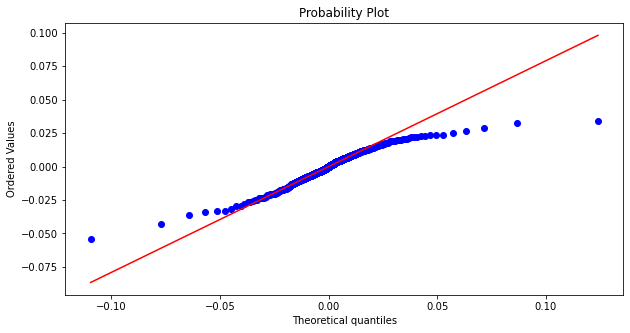

In [11]:
fig = plt.figure(figsize=(10, 5))
ss.probplot(prices.pct_change().dropna(), dist=ss.jf_skew_t(*params_t), plot=plt)
plt.show()

### Dynamic LP strategy with a rolling window
1. Fit params for the distribution within the window
2. Difine the range according to ditribution quantiles
3. Backtest ste stategy to choose an appropriate quantile level

In [12]:
def metrics_within_window(prices, volumes, window, upper_quantile, lower_quantile):
    params_t = ss.jf_skew_t.fit(prices.iloc[:window].pct_change().dropna())
    a, b, mean, sigma  = params_t
    upper_bound = ss.jf_skew_t.ppf(upper_quantile, a, b, mean, sigma)
    lower_bound = ss.jf_skew_t.ppf(lower_quantile, a, b, mean, sigma)
    mask = (prices[window:] < prices[window] * (1 + upper_bound)) & (prices[window:] > prices[window] * (1 + lower_bound))
    volume_in = volumes[window:][mask].sum() / volumes[window:].sum()
    time_in = mask.sum() / len(mask)
    fees_estimate = volumes[window:][mask].sum() / (prices[window] * (upper_bound - lower_bound))
    return IL_t(prices[-1], prices[window], prices[window] * (1 + lower_bound), prices[window] * (1 + upper_bound)), volume_in, time_in, fees_estimate

In [13]:
params = {'window': 60, 'step': 15, 'quantile_level': 0.05}

In [14]:
class Backtest:
    def __init__(self, prices, volumes, start_test, params):
        
        self.prices = prices
        self.volumes = volumes
        self.start_test = start_test
        self.params = params
        self.results = {'IL':[], 'volume_in':[], 'time_in':[], 'fees_estimate':[]}
        
    def train_test_split(self):
        self.prices_train = self.prices[(self.prices.index < self.start_test)]
        self.prices_test = self.prices[(self.prices.index >= self.start_test)]
        self.volumes_train = self.volumes[(self.prices.index < self.start_test)]
        self.volumes_test = self.volumes[(self.prices.index >= self.start_test)]
        
    def run(self):
        rolling_IL = []
        rolling_volume_in = []
        rolling_time_in = []
        for start in range(0, len(self.prices_train) - (self.params['window']+self.params['step']) + 1, self.params['step']):
            IL, volume_in, time_in, fees_estimate = metrics_within_window(self.prices_train[start:start+self.params['window']+self.params['step']], 
                                                           self.volumes_train[start:start+self.params['window']+self.params['step']],
                                                           self.params['window'], 
                                                           1 - self.params['quantile_level'], 
                                                           self.params['quantile_level'])
            rolling_IL.append(IL)  
            rolling_volume_in.append(volume_in)
            rolling_time_in.append(time_in)
            
        self.results['IL'].append(np.mean(rolling_IL))
        self.results['volume_in'].append(np.mean(rolling_volume_in))
        self.results['time_in'].append(np.mean(rolling_time_in))
        self.results['fees_estimate'].append(np.mean(fees_estimate))
    
    def backtest_quantile_level(self, quantile_levels):
        for quantile_level in tqdm(quantile_levels):
            self.params['quantile_level'] = quantile_level
            self.run()
            
    def backtest_window(self, windows):
        for window in tqdm(windows):
            self.params['window'] = window
            self.run()
            
    def backtest_step(self, steps):
        for step in tqdm(steps):
            self.params['step'] = step
            self.run()
        
        

In [25]:
backtest = Backtest(prices, volumes, start_test, params)

In [26]:
backtest.train_test_split()

In [37]:
backtest.backtest_quantile_level((1 - np.linspace(0.995, 0.5, 10, endpoint=False)))

100%|███████████████████████████████████████████| 10/10 [15:18<00:00, 91.85s/it]
